In [1]:
using GraphRecipes
using Clustering
using Plots
using DelimitedFiles
using LinearAlgebra
using MatrixNetworks
using SparseArrays
using Random
Random.seed!(1234);  # determinism
# pre-compile some code
plot([1], [1]);      
spy(sparse([1], [1], 1, 1, 1));
kmeans([1. 1.; 2. 2.; 3. 3.]', 2);

┌ Warning: implicit `dims=2` argument now has to be passed explicitly to specify that distances between columns should be computed
│   caller = ip:0x0
└ @ Core :-1
┌ Warning: implicit `dims=2` argument now has to be passed explicitly to specify that distances between columns should be computed
│   caller = _kmeans!(::Adjoint{Float64,Array{Float64,2}}, ::Nothing, ::Array{Float64,2}, ::Array{Int64,1}, ::Array{Float64,1}, ::Array{Int64,1}, ::Array{Float64,1}, ::Int64, ::Float64, ::Int64, ::Distances.SqEuclidean) at kmeans.jl:115
└ @ Clustering /Users/arb/.julia/packages/Clustering/pvAp6/src/kmeans.jl:115


In [2]:
# Generate SBM
function SBM(ns::Vector{Int64}, P::Array{Float64,2})
    A = zeros(sum(ns), sum(ns))
    nb = length(ns)
    for bi in 1:nb
        si = sum([ns[r] for r in 1:(bi-1)])
        for bj in bi:nb
            sj = sum([ns[r] for r in 1:(bj-1)])
            if bi == bj
                for ii = 1:ns[bi], jj = (ii+1):ns[bj]
                    if rand() <= P[bi, bj]; A[si + ii, sj + jj] = 1; end
                end
            else
                for ii = 1:ns[bi], jj = 1:ns[bj]
                    if rand() <= P[bi, bj]; A[si + ii, sj + jj] = 1; end
                end                
            end
        end
    end
    return sparse(max.(A, A'))
end

ns = [100, 50, 150]
A = SBM(ns, [0.5 0.2 0.15; 0.2 0.6 0.25; 0.15 0.25 0.55])
spy(A, legend=nothing, m=:heat)

In [3]:
function first_evecs_Laplacian(A, k::Int64; normalized=false)
    d = vec(sum(A, dims=1))
    D = Diagonal(d)
    Dinv = Diagonal(d .^ (-1/2))
    L = Diagonal(d) - A
    if normalized; L = Dinv * L * Dinv; end
    V = eigen(Matrix(L)).vectors[:, 1:k]
    if normalized; V = Dinv * V; end
    return V
end

V = first_evecs_Laplacian(A, 3, normalized=true)

300×3 Array{Float64,2}:
 -0.00586412   0.00992987  -0.00460341 
 -0.00586412   0.00873367  -0.00147101 
 -0.00586412   0.00973956  -0.0075143  
 -0.00586412   0.0120187   -0.00668622 
 -0.00586412   0.00917721   0.000100993
 -0.00586412   0.00886103  -0.00298548 
 -0.00586412   0.00698268  -0.00129398 
 -0.00586412   0.0082902    0.000252877
 -0.00586412   0.00795788  -0.00403339 
 -0.00586412   0.00797091   0.00211261 
 -0.00586412   0.0103059   -0.00422374 
 -0.00586412   0.00743961  -0.00530224 
 -0.00586412   0.00840467  -0.00315123 
  ⋮                                    
 -0.00586412  -0.00483856  -0.00236521 
 -0.00586412  -0.00724713  -0.00549558 
 -0.00586412  -0.00409514  -0.000398663
 -0.00586412  -0.00526123  -0.00308009 
 -0.00586412  -0.00499855  -0.00418629 
 -0.00586412  -0.00510044  -3.50296e-5 
 -0.00586412  -0.00420879  -0.00714799 
 -0.00586412  -0.00509425   0.000280509
 -0.00586412  -0.00417347  -0.00261141 
 -0.00586412  -0.00497131  -0.00649239 
 -0.00586412  -0

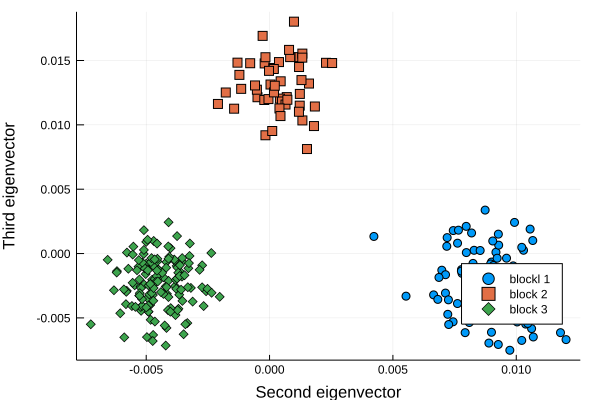

In [4]:
n1, n2, n3 = ns
inds1 = 1:n1
inds2 = (n1 + 1):(n1 + n2)
inds3 = (n1 + n2 + 1):(n1 + n2 + n3)
scatter(V[inds1, 2], V[inds1, 3], marker=:circle, 
        xlabel="Second eigenvector", ylabel="Third eigenvector", 
        label="blockl 1", legend=:bottomright)
scatter!(V[inds2, 2], V[inds2, 3], 
         marker=:square, label="block 2")
scatter!(V[inds3, 2], V[inds3, 3], 
         marker=:diamond, label="block 3")

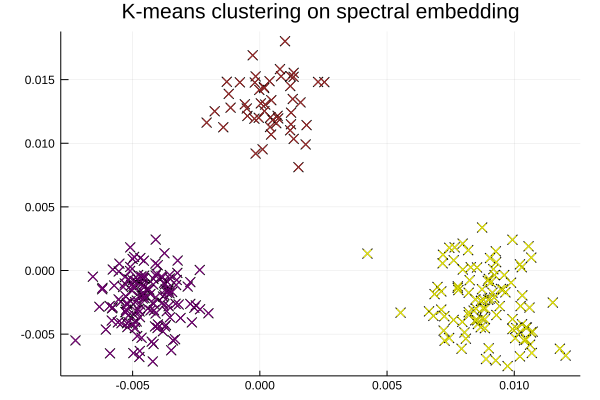

In [5]:
assignments = kmeans(V', 3).assignments;
inds1, inds2, inds3 = [findall(assignments .== i) for i = 1:3]
scatter( V[inds1,2], V[inds1,3], color="purple", label="", marker=:X)
scatter!(V[inds2,2], V[inds2,3], color="brown",  label="", marker=:X)
scatter!(V[inds3,2], V[inds3,3], color="yellow", label="", marker=:X)
title!("K-means clustering on spectral embedding")

In [6]:
# Read email-Eu-core
data = readdlm("email-Eu-core.txt")
n = 1005
A = sparse(convert(Vector{Int64}, data[:,1] .+ 1),
           convert(Vector{Int64}, data[:,2] .+ 1), 
           1, n, n)
# Remove diagonal and make undirected
A -= Diagonal(Diagonal(A))
A = min.(max.(A, A'), 1)
# Work with largest connected component
ci = scomponents(A)
inds = shuffle(findall(ci.map .== 1))
A = A[inds, inds]
spy(A, legend=nothing, m=:heat)

In [7]:
# Spectral clustering of the 
k = 10
V = first_evecs_Laplacian(A, k, normalized=true)
assignments = kmeans(V', k).assignments;
inds = [findall(assignments .== i) for i = 1:k]
order = reverse(vcat(inds...))
spy(A[order, order], legend=nothing, m=:heat)

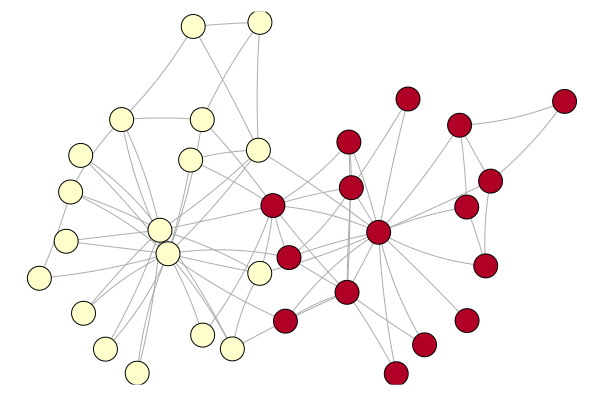

In [8]:
# Modularity maximization and ZKC
data = readdlm("zacharys-KC.txt")
n = 34
A = sparse(convert(Vector{Int64}, data[:,1]),
           convert(Vector{Int64}, data[:,2]), 1, n, n)
A = max.(A, A')

d = vec(sum(A,dims=1))
m = sum(triu(A,1))
v = eigen(Matrix(A - d * d' / (2 * m))).vectors[:,end]

mod_labels = zeros(n)
mod_labels[findall(v .< 0)] .= 1

Random.seed!(1345)  # plot same each time
plot(
    graphplot(A,
              method=:stress,
              marker = (:YlOrRd, :circ),
              marker_z = mod_labels,
              linecolor = :darkgrey
             )
)